# Your Uni : fy2235
# Your AI Model Share Username: dacatking
# Your Full name : Fengrui Yang
# Link to your Public Github repository with Final report  : Fill here


# World Happiness Classification Competition
Goals :
- Understand how the models function
- Understand what the parameters control
- Share your models to a centralized leaderboard
- Learn from the model experimentation process
- Make a good looking notebook report
- Upload as a personal project on Github

**Overall Steps:**
1.   Get data in and set up X_train / X_test / y_train
2.   Preprocess data using Sklearn Column Transformer/ Write and Save Preprocessor function
3. Fit model on preprocessed data and save preprocessor function and model
4. Generate predictions from X_test data and submit model to competition
5. Repeat submission process to improve place on leaderboard



In [1]:
#install aimodelshare library
! pip install aimodelshare --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 975.8/975.8 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.3/96.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.5/298.5 kB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 329.0/329.0 kB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.4/178.4 kB 28.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.0/147.0 k

## 0. Get data in and set up X_train, X_test, y_train objects

**Instructions:**
Upload the world_happiness_competition_data.zip and newcountryvars.csv files on Colab by pressing the Folder icon on left tab (Shows "Files" on hovering), and then clicking the left-most file upload button (Shows "Upload to Session Storage" Alt text on hovering)

In [165]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [166]:
# Get competition data from course folder and unzip
# importing the zipfile module
from zipfile import ZipFile

# loading the temp.zip and creating a zip object
with ZipFile("world_happiness_competition_data.zip", 'r') as zObject:

    # Extracting all the members of the zip
    # into a specific location.
    zObject.extractall()

In [167]:
# Load data
X_train = pd.read_csv('world_happiness_competition_data/X_train.csv')
X_test = pd.read_csv('world_happiness_competition_data/X_test.csv')
y_train = pd.read_csv('world_happiness_competition_data/y_train.csv')
y_train_labels = y_train.idxmax(axis=1) ## Examine what this does and write in next cell

X_train.head()

,Country or region,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,name,region,sub-region,Terrorist_attacks
0,Peru,0.960,1.274,0.854,0.455,0.083,0.027,Peru,Americas,Latin America and the Caribbean,18.000000
1,Nicaragua,0.694,1.325,0.835,0.435,0.200,0.127,Nicaragua,Americas,Latin America and the Caribbean,125.611111
2,Greece,1.181,1.156,0.999,0.067,0.000,0.034,Greece,Europe,Southern Europe,112.000000
3,Qatar,1.684,1.313,0.871,0.555,0.220,0.167,Qatar,Asia,Western Asia,57.333333
4,Uzbekistan,0.745,1.529,0.756,0.631,0.322,0.240,Uzbekistan,Asia,Central Asia,125.611111


Write in the next cell what the y_train_labels = y_train.idxmax(axis=1) line does. What is the difference between y_train_labels and y_train?

This line turns a sheet into a series of labels. In y_train, there is a sheet with 5 different columns and only one 1 in each row, and in y_train_labeels, there is just a series of labels where the 1s originally is.

##  Add new data

In [168]:
# Truncated and cleaned up region data to merge (Week 4 folder)
countrydata=pd.read_csv("newcountryvars.csv")

countrydata.head()

,country_name,population,population_below_poverty_line,hdi,life_expectancy,expected_years_of_schooling,mean_years_of_schooling,gni
0,India,1339180127,21.9,0.623559,68.322,11.696590,6.298834,5663.474799
1,Nigeria,190886311,70.0,0.527105,53.057,9.970482,6.000000,5442.901264
2,Mexico,129163276,46.2,0.761683,76.972,13.299090,8.554985,16383.106680
3,Pakistan,197015955,29.5,0.550354,66.365,8.106910,5.089460,5031.173074
4,Bangladesh,164669751,31.5,0.578824,71.985,10.178706,5.241577,3341.490722


In [169]:
# Merge in new data to X_train and X_test by taking "Country or region" from first table and "country_name" from 2nd table.

X_train=X_train.merge(countrydata, how='left', left_on='Country or region', right_on='country_name')
X_test=X_test.merge(countrydata, how='left', left_on='Country or region', right_on='country_name')


In [170]:
X_train.head(1)

,Country or region,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,name,region,sub-region,Terrorist_attacks,country_name,population,population_below_poverty_line,hdi,life_expectancy,expected_years_of_schooling,mean_years_of_schooling,gni
0,Peru,0.96,1.274,0.854,0.455,0.083,0.027,Peru,Americas,Latin America and the Caribbean,18.0,Peru,32165485.0,22.7,0.739749,74.814,13.38634,9.01347,11294.84033


# EDA

In [171]:
print(X_train.dtypes)

Country or region                 object
GDP per capita                   float64
Social support                   float64
Healthy life expectancy          float64
Freedom to make life choices     float64
Generosity                       float64
Perceptions of corruption        float64
name                              object
region                            object
sub-region                        object
Terrorist_attacks                float64
country_name                      object
population                       float64
population_below_poverty_line    float64
hdi                              float64
life_expectancy                  float64
expected_years_of_schooling      float64
mean_years_of_schooling          float64
gni                              float64
dtype: object


Describe what you see above?

Apart from names of countries and regions, the chart were entirely constructed by float64.

Find out the number and percentage of missing values in the table per column

In [172]:
# Your code here:
missing_values_count = X_train.isnull().sum()
missing_values_percentage = (X_train.isnull().sum() / len(X_train)) * 100
missing_values_df = pd.DataFrame({
    'missing_values': missing_values_count,
    'percentage_of_total': missing_values_percentage
})
missing_values_df['percentage_of_total'] = missing_values_df['percentage_of_total'].round(2).astype(str) + '%'
missing_values_df

,missing_values,percentage_of_total
Country or region,0,0.0%
GDP per capita,0,0.0%
Social support,0,0.0%
Healthy life expectancy,0,0.0%
Freedom to make life choices,0,0.0%
Generosity,0,0.0%
Perceptions of corruption,0,0.0%
name,0,0.0%
region,0,0.0%
sub-region,0,0.0%


Plot the frequency distribution / histogram of some of the numerical features that you think are important

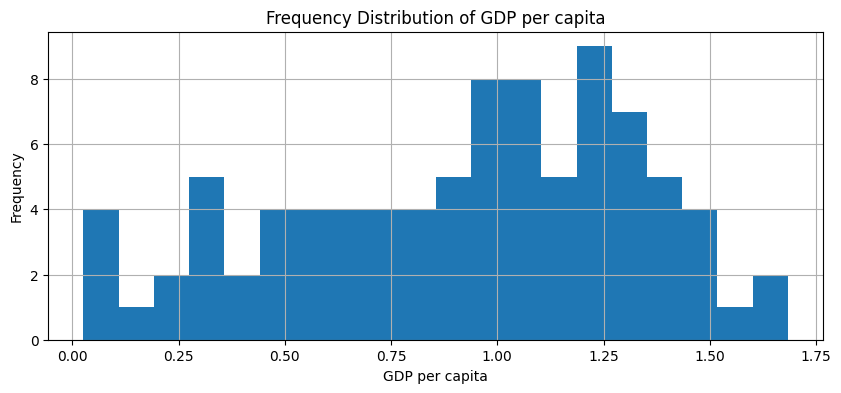

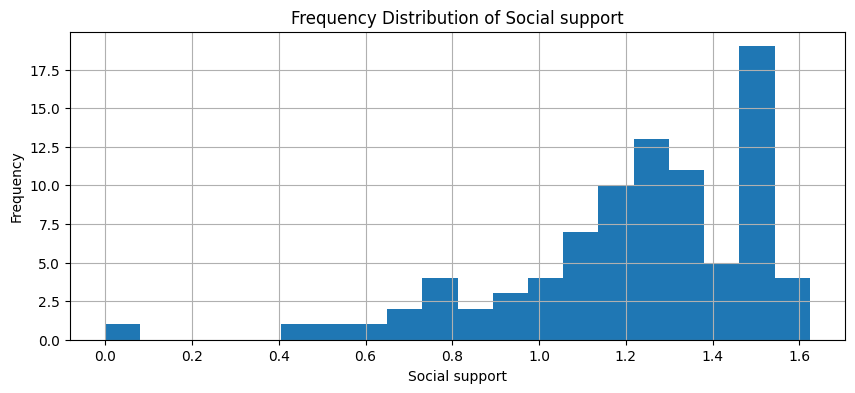

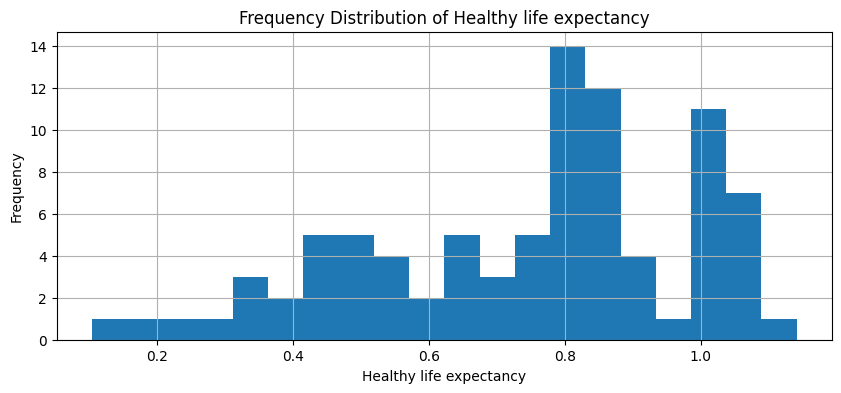

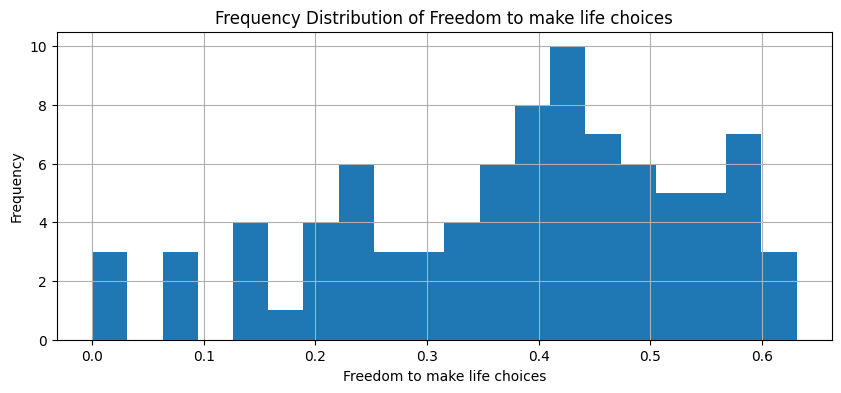

In [173]:
# Your plotting code here:
columns_to_plot = ['GDP per capita','Social support', 'Healthy life expectancy', 'Freedom to make life choices']

for column in columns_to_plot:
    plt.figure(figsize=(10, 4))
    X_train[column].hist(bins=20)
    plt.title(f'Frequency Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

Plot the categorical variables and their distribution

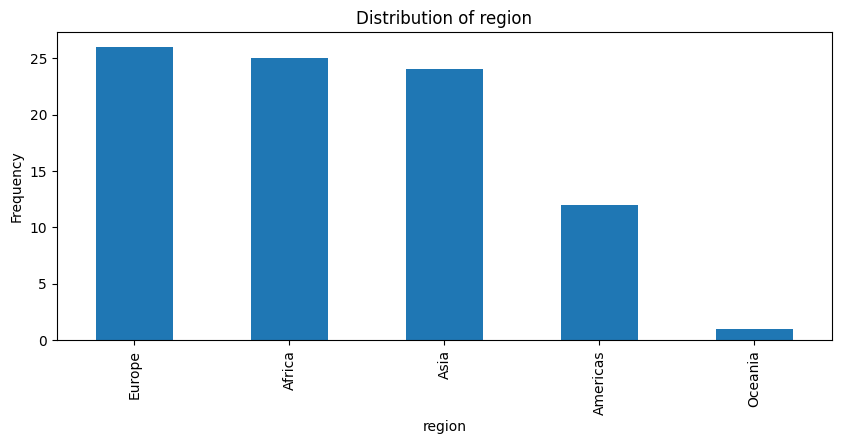

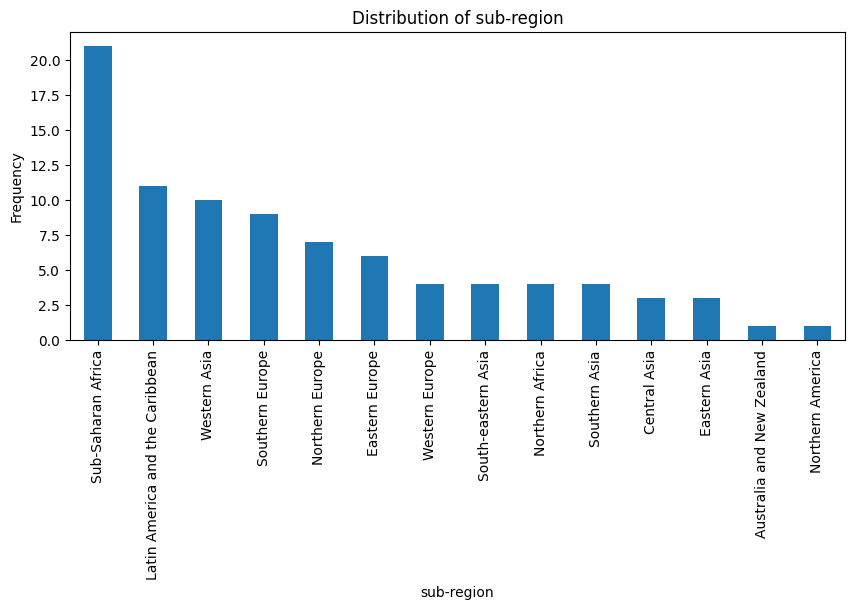

In [174]:
# Your plotting code here:
columns_to_plot = ['region', 'sub-region']

for column in columns_to_plot:
    plt.figure(figsize=(10, 4))
    X_train[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    plt.show()

Explore relationships between variables (bivariate, etc), correlation tables, and how they associate with the target variable.

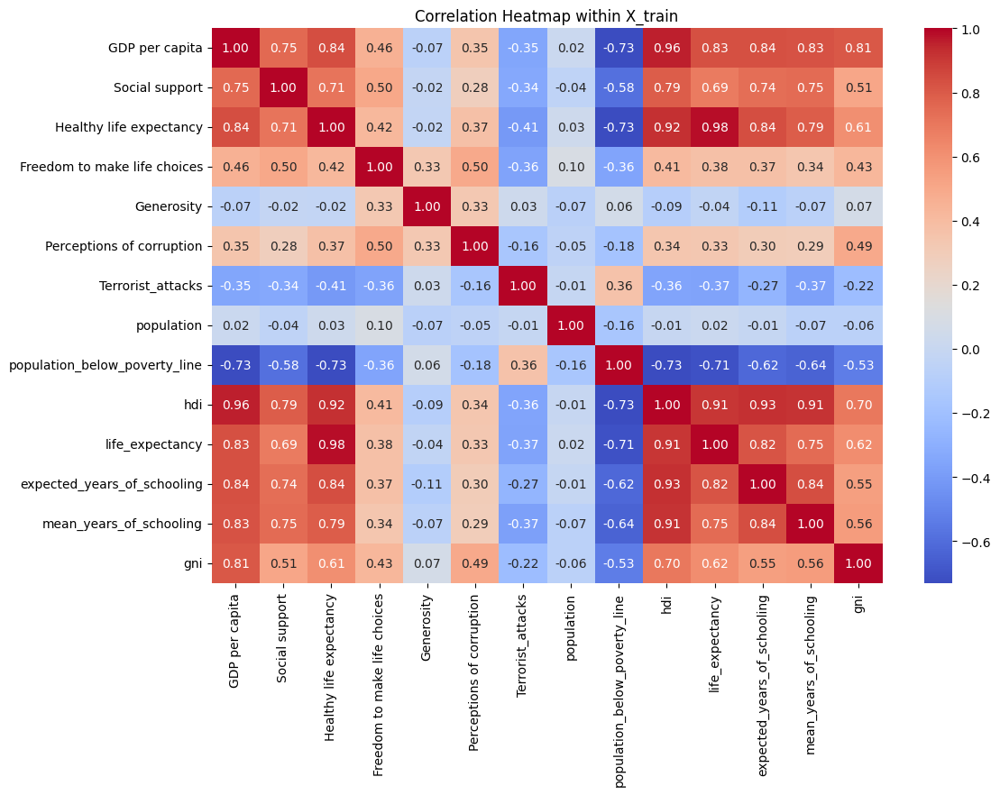

In [175]:
# Your plotting code(s) here:
numerical_columns = X_train.select_dtypes(include=['float64']).columns
correlation_matrix = X_train[numerical_columns].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Heatmap within X_train')
plt.show()

Write what you observed and your General comments on what should be done:

(GDP per capita, hdi, expected_years_of_schooling, mean_years_of_schooling,life_expectancy, Healthy life expectancy, Social support) are highly correlateed. Keep only GDP per capita and drop all others.

##2.   Preprocess data using Sklearn Column Transformer/ Write and Save Preprocessor function


In [176]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Create the preprocessing pipelines for both numeric and categorical data.

numeric_features = X_train.select_dtypes(include=['float64']).columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')), ## Is this good enough?
    ('scaler', StandardScaler())]) # You will need to describe why this is being done in the next cell

categorical_features = ['region', 'sub-region']

#Replacing missing values with Modal value and then one hot encoding.
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy = 'most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])
# final preprocessor object set up with ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

#Fit your preprocessor object
preprocess=preprocessor.fit(X_train)

Describe step-by-step what we are doing above, and why? You are free to change how values are imputed. What change did you make if any, and why?

For the numerical features, we filled in 0s in missing values and standarlize it: remove the mean and scale to unit variance. I change the 0s into means so that we can better estimate the missing data. For the categorical features, fill the most frequent features for the missing value(although there exist none), and use onehotencoder to transform it into ML readable data. Combine those features into one set in the end.

In [177]:
# Write function to transform data with preprocessor

def preprocessor(data):
    data.drop(['Country or region', 'name'], axis=1) #, 'hdi', 'expected_years_of_schooling', 'mean_years_of_schooling', 'life_expectancy', 'Healthy life expectancy', 'Social support'
    preprocessed_data=preprocess.transform(data)
    return preprocessed_data

What are the differences between the "preprocessor" object, the "preprocess" object, the "preprocessor" function,  and the "preprocessed_data" that is returned finally?

The "preprocessor" object is an instance of ColumnTransformer from scikit-learn.

The "preprocess" object is the "preprocessor" object after it has been fitted to X_train.

THe "preprocessor" function is a custom function defined for dropping insignificant columns.

The "preprocessed_data" is the actual output.

In [179]:
# check shape of X data after preprocessing it using our new function
preprocessor(X_train).shape

(88, 19)

##3. Fit model on preprocessed data and save preprocessor function and model


In [183]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(preprocessor(X_train), y_train_labels)


# Your cell should have a score between 0-1 as output

['Country or region',
 'GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption',
 'name',
 'region',
 'sub-region',
 'Terrorist_attacks',
 'country_name',
 'population',
 'population_below_poverty_line',
 'hdi',
 'life_expectancy',
 'expected_years_of_schooling',
 'mean_years_of_schooling',
 'gni']

#### Save preprocessor function to local "preprocessor.zip" file

In [193]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor,"")

Your preprocessor is now saved to 'preprocessor.zip'


#### Save model to local ".onnx" file

In [194]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

## 4. Generate predictions from X_test data and submit model to competition


In [192]:
#Set credentials using modelshare.org username/password

from aimodelshare.aws import set_credentials

#This is the unique rest api that powers this World Happiness Classification Playground
## Do not change this
apiurl="https://e2w6gh3id1.execute-api.us-east-2.amazonaws.com/prod/m"

set_credentials(apiurl=apiurl)

Modelshare.ai Username:··········
Modelshare.ai Password:··········
Modelshare.ai login credentials set successfully.


In [142]:
#Instantiate Competition
import aimodelshare as ai
mycompetition= ai.Competition(apiurl)

In [143]:
#Submit Model 1:

#-- Generate predicted values (Model 1)
prediction_labels = model.predict(preprocessor(X_test))

model_filepath1 = "model.onnx"
preprocessor_filepath="preprocessor.zip"

# Submit Model 1 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath1,
                           preprocessor=preprocessor_filepath,
                                 prediction_submission=prediction_labels)

Insert search tags to help users find your model (optional): Version1
Provide any useful notes about your model (optional): No Update

Your model has been submitted as model version 1073

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [144]:
# Get leaderboard to explore current best model architectures

# Get raw data in pandas data frame
data = mycompetition.get_leaderboard()

# Stylize leaderboard data
mycompetition.stylize_leaderboard(data)

## 5. Repeat submission process to improve place on leaderboard


In [186]:
X_train.columns.tolist()

['Country or region',
 'GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption',
 'name',
 'region',
 'sub-region',
 'Terrorist_attacks',
 'country_name',
 'population',
 'population_below_poverty_line',
 'hdi',
 'life_expectancy',
 'expected_years_of_schooling',
 'mean_years_of_schooling',
 'gni']

In [197]:
# Train and submit model 2 using same preprocessor (note that you could save a new preprocessor, but we will use the same one for this example).
from sklearn.ensemble import RandomForestClassifier

model_2 = RandomForestClassifier(n_estimators=300, max_depth=5)
model_2.fit(preprocessor(X_train), y_train_labels)


# Now you would evaluate model_2 just like you evaluated the first model,
# potentially using cross-validation or a validation set.


RandomForestClassifier(random_state=42)

 What changes did you make, what do the parameters you changed control, and why does it improve performance?

I increase the number of n_estimators and constrain the max_depth to 5.

In [198]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

feature_count= preprocessor(X_test).shape[1]# Get count of preprocessed features

initial_type = [('float_input', FloatTensorType([None, feature_count]))] # Insert correct number of preprocessed features

onnx_model = model_to_onnx(model_2, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

# Serialize your model to save it as an onnx file
with open("model2.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())
feature_count

33

In [199]:
#Submit Model 2:

#-- Generate predicted y values (Model 2)
prediction_labels = model.predict(preprocessor(X_test))# Predict
model_filepath2 = "model2.onnx"
preprocessor_filepath="preprocessor.zip"

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath2,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 1077

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [200]:
# Compare two or more models
data=mycompetition.compare_models([2,3], verbose=1)
mycompetition.stylize_compare(data)

,param_name,default_value,model_version_2,model_version_3
0,bootstrap,True,True,True
1,ccp_alpha,0.000000,0.000000,0.000000
2,class_weight,None,None,None
3,criterion,gini,gini,gini
4,max_depth,None,3,5
5,max_features,auto,auto,auto
6,max_leaf_nodes,None,None,None
7,max_samples,None,None,None
8,min_impurity_decrease,0.000000,0.000000,0.000000
9,min_impurity_split,None,None,None


Do you think it is worth making more changes to the parameters? Should we keep trying random values and see what works better? What is an alternative to doing this manually?

Since there are many columns that are correlatted. I propose drop some of them.

In [209]:
# Submit a third model using GridSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import numpy as np

param_grid = {
    'n_estimators': [5,15],
    'max_depth': [3,7],
    'min_samples_split': [20,80],
    'min_samples_leaf': [10,30]
}

model = RandomForestClassifier()
gridmodel = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the data
gridmodel.fit(preprocessor(X_train), y_train_labels)

# Extract the best parameters and the best score
best_params = gridmodel.best_params_
best_score = gridmodel.best_score_


#extract best score and parameter by calling objects "best_score_" and "best_params_"
print("best mean cross-validation score: {:.3f}".format(gridmodel.best_score_))
print("best parameters: {}".format(gridmodel.best_params_))


best mean cross-validation score: 0.535
best parameters: {'max_depth': 3, 'min_samples_leaf': 10, 'min_samples_split': 20, 'n_estimators': 15}


In [210]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  # Insert correct number of preprocessed features

onnx_model = model_to_onnx(gridmodel, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("gridmodel.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [211]:
#Submit Model 3:

prediction_labels = gridmodel.predict(preprocessor(X_test))# Predict
model_filepath2 = "gridmodel.onnx"
preprocessor_filepath="preprocessor.zip"

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath2,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 1081

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [212]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

In [216]:
# Compare two or more models
data=mycompetition.compare_models([9,10], verbose=1)
mycompetition.stylize_compare(data)

,param_name,default_value,model_version_9,model_version_10
0,bootstrap,True,True,True
1,ccp_alpha,0.000000,0.000000,0.000000
2,class_weight,None,None,None
3,criterion,gini,gini,gini
4,max_depth,None,5,3
5,max_features,auto,auto,auto
6,max_leaf_nodes,None,None,None
7,max_samples,None,None,None
8,min_impurity_decrease,0.000000,0.000000,0.000000
9,min_impurity_split,None,None,None


In [222]:
# Here are several classic ML architectures you can consider choosing from to experiment with next:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier


param_grid_svc = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'kernel': ['linear', 'rbf']
}

grid_svc = GridSearchCV(SVC(random_state=42), param_grid_svc, cv=3, scoring='accuracy', n_jobs=-1)

grid_svc.fit(preprocessor(X_train), y_train_labels)

from aimodelshare.aimsonnx import model_to_onnx

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  # Insert correct number of preprocessed features

onnx_model = model_to_onnx(grid_svc, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model_svc.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

#-- Generate predicted values
prediction_labels = grid_svc.predict(preprocessor(X_test))

model_filepath4 = "model_svc.onnx"

# Submit model to Competition Leaderboard
mycompetition.submit_model(model = model_filepath4,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)


Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 1082

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


Describe what were the parameters you defined in GradientBoostingClassifier, and/or BaggingClassifier, and/or KNNs, and/or SVC? What worked and why?

I used a grid_svc to try to decide which combination is the best.

# 6. Basic Deep Learning

In [226]:
# Now experiment with deep learning models:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation

keras_model = Sequential([
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(5, activation='softmax')
])
#Use Softmax activation in last layer. How many neurons should there be in the last layer?



# Compile model
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Fitting the NN to the Training set
keras_model.fit(preprocessor(X_train), y_train, batch_size = 20, epochs = 300, validation_split=0.25)

Epoch 1/300
4/4 [==============================] - 1s 108ms/step - loss: 1.5846 - accuracy: 0.2727 - val_loss: 1.5933 - val_accuracy: 0.3182
Epoch 2/300
4/4 [==============================] - 0s 18ms/step - loss: 1.5721 - accuracy: 0.3485 - val_loss: 1.5827 - val_accuracy: 0.3182
Epoch 3/300
4/4 [==============================] - 0s 18ms/step - loss: 1.5605 - accuracy: 0.3788 - val_loss: 1.5746 - val_accuracy: 0.3182
Epoch 4/300
4/4 [==============================] - 0s 22ms/step - loss: 1.5510 - accuracy: 0.3939 - val_loss: 1.5679 - val_accuracy: 0.3636
Epoch 5/300
4/4 [==============================] - 0s 23ms/step - loss: 1.5413 - accuracy: 0.4091 - val_loss: 1.5610 - val_accuracy: 0.3182
Epoch 6/300
4/4 [==============================] - 0s 20ms/step - loss: 1.5318 - accuracy: 0.4394 - val_loss: 1.5545 - val_accuracy: 0.3182
Epoch 7/300
4/4 [==============================] - 0s 21ms/step - loss: 1.5224 - accuracy: 0.4394 - val_loss: 1.5476 - val_accuracy: 0.3182
Epoch 8/300
4/4 [==

Which activations did you use in the middle layers? Why was softmax used in the last layer?

I used ReLU in the middle layers. It is because of this is a multi-class classification problem.

Was it a good idea to train for 300 epochs? Should you train a bit more? Why or why not?

The mimimal val_loss was reached at 150 epochs. 300 epochs may have caused overfitting.

Why is loss='categorical_crossentropy' and optimizer='sgd'? Would you want to change something? Why / Why not?

The categorical_crossentropy is perfect with multi-class classification question. SGD is also a widely used optimizer. I would like to try some other optimizers, although they may not be better.

Can you try getting the model's training history out and plotting the curves?

Epoch 1/300
4/4 [==============================] - 0s 25ms/step - loss: 0.1165 - accuracy: 0.9697 - val_loss: 1.4918 - val_accuracy: 0.5909
Epoch 2/300
4/4 [==============================] - 0s 16ms/step - loss: 0.1216 - accuracy: 0.9545 - val_loss: 1.5448 - val_accuracy: 0.5909
Epoch 3/300
4/4 [==============================] - 0s 8ms/step - loss: 0.1284 - accuracy: 0.9697 - val_loss: 1.4918 - val_accuracy: 0.5909
Epoch 4/300
4/4 [==============================] - 0s 16ms/step - loss: 0.1198 - accuracy: 0.9697 - val_loss: 1.4969 - val_accuracy: 0.5909
Epoch 5/300
4/4 [==============================] - 0s 9ms/step - loss: 0.1241 - accuracy: 0.9697 - val_loss: 1.4546 - val_accuracy: 0.5909
Epoch 6/300
4/4 [==============================] - 0s 17ms/step - loss: 0.1100 - accuracy: 0.9697 - val_loss: 1.4528 - val_accuracy: 0.5909
Epoch 7/300
4/4 [==============================] - 0s 14ms/step - loss: 0.1107 - accuracy: 0.9697 - val_loss: 1.4421 - val_accuracy: 0.5909
Epoch 8/300
4/4 [=====

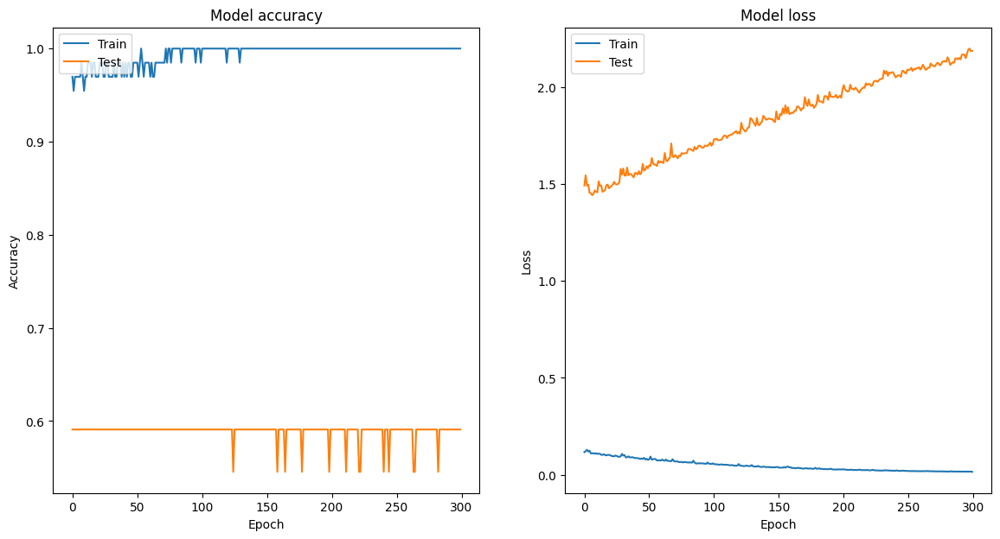

In [229]:
## Your code to plot training and validation curves in a single plot (Make changes in the model cell to be able to do this)
history = keras_model.fit(preprocessor(X_train), y_train, validation_split=0.25, epochs=300, batch_size=20, verbose=1)

plt.figure(figsize=(14,7))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [234]:
# Save keras model to ONNX file

from aimodelshare.aimsonnx import model_to_onnx

onnx_model = model_to_onnx(keras_model, framework='keras',
                          transfer_learning=False,
                          deep_learning=True)

with open("keras_model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [241]:
# Submit keras model:

#-- Generate predicted y values

#Note: Keras predict returns the predicted column index location for classification models
prediction_column_index= keras_model.predict(preprocessor(X_test))

# extract correct prediction labels
prediction_labels = np.argmax(prediction_column_index, axis=1)

model_filepath5 = "model.onnx"

# Submit Model 1 to Competition Leaderboard
mycompetition.submit_model(model = model_filepath5,
                                 prediction_submission=prediction_labels,
                                 preprocessor=preprocessor_filepath)

3/3 [==============================] - 0s 4ms/step
Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 1083

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.ai/detail/model:3164


In [242]:
# Check leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

# 7. Submission of final report and clean code to github

[This is a final project you display on your GitHub to the World]

**Instructions**
- Make a new notebook, visualize any plots you found relevant
- Reproduce the code you used for the best models and display results
- Write what insights you found useful and what behaviours were observed
- Make it in a style of a clean, succint report (within the .ipynb)
- Upload this final report notebook to a new repository in your personal github account
- Remember to paste the link of your final repo at the top of this notebook where asked